In [9]:
import os
import numpy as np
import scipy.spatial as spatial
import matplotlib.pyplot as plt

# Reading the Map File

Read the pgm map into a list for use later

In [10]:

def read_pgm(pgmf):
    with open( pgmf, 'rb' ) as f:
        """Return a raster of integers from a PGM as a list of lists."""
        header =  f.readline()
        print( header[0], header[1] )
        assert header == b'P5\n'
        while True:
            l = f.readline()
            if not l[0] == 35:   # skip any header comment lines
                break
        (width, height) = [int(i) for i in l.split()]
        depth = int(f.readline())
        assert depth <= 255

        raster = []
        for y in range(height):
            row = []
            for y in range(width):
                row.append(ord(f.read(1)))
            raster.append(row)

    return raster

r = read_pgm( '{}/sim_map.pgm'.format(os.getcwd()) )
b = np.asarray(r)





80 53


# Notes

The output of the file contains **_zeros for obstacles_**, and **_255 for free space_**

# Potential Fields

This is an _unoptimized_ implementation of the potential fields algorithm.

First, the key variables will be assigned.

## Edge Detection

This uses a shift comparison to detect edges, and then re-shifts the edge array to match the original map.

In [11]:
shift = -1
edge_x = (b ^ np.roll(b,shift=shift,axis=0))
edge_y = (b ^ np.roll(b,shift=shift,axis=1))

edges = np.where(edge_y==0, edge_x, edge_y)

In [12]:
# Object influence region (grids)
dist_infl = 40

# Force Variables

k_att = 0.1
k_rep = -dist_infl/k_att
# k_rep = k_att

# Waypoints
start = np.array([95,5])
# waypoint = np.array([95,95])
waypoint = np.array([5,95])

# Obstacles
obstacles = np.where(edges == 255)
obstacles = np.asarray(list(zip(obstacles[0],obstacles[1])))

# Valid Robot Points
traversible = np.where(b==255)
traversible = np.asarray(list(zip(traversible[0],traversible[1])))

## Attractive & Repulsive Forces

Now, an vector of _attractive_ and _repulsive_ forces will be calculated

In [13]:
F_attr_x = np.zeros(b.shape)
F_attr_y = np.zeros(b.shape)
F_repl_x = np.zeros(b.shape)
F_repl_y = np.zeros(b.shape)

F_tot_x = np.zeros(b.shape)
F_tot_y = np.zeros(b.shape)
F_tot = np.zeros(b.shape)

for pt in traversible:
    i = pt[0]
    j = pt[1]

    dist_goal = np.linalg.norm(np.subtract([i,j],waypoint))
    F_attr = -k_att * np.subtract([i,j],waypoint)
    F_attr_x[i,j] = F_attr[0]
    F_attr_y[i,j] = F_attr[1]
    
    for obs in obstacles:
        dist_obst = np.linalg.norm(np.subtract([i,j],[obs[0],obs[1]]))

        if dist_obst <= dist_infl:

            coefficient = k_rep * (1/dist_obst - 1/dist_infl) * (1/(np.square(dist_obst))) * (1/dist_obst)
            F_repl = coefficient * np.subtract([i,j],[obs[0],obs[1]])
            
            if not np.isnan(np.sum(F_repl)):
                F_repl_x[i,j] = F_repl_x[i,j] + F_repl[0]
                F_repl_y[i,j] = F_repl_y[i,j] + F_repl[1]

In [14]:
F_tot_x = np.zeros(b.shape)
F_tot_y = np.zeros(b.shape)
F_tot = np.zeros(b.shape)

F_tot_x = np.flip(np.subtract(F_attr_x, F_repl_x), 0)     
F_tot_y = np.flip(np.subtract(F_attr_y, F_repl_y), 0)

F_tot = np.sqrt(np.add(np.power(F_tot_x,2),np.power(F_tot_y,2)))

# Moving the Robot

Now that the potential fields and forces are generated, the motion and pose of the robot will be calculated.

In [15]:
# Velocity
# The velocity of the robot is proportional to the force it experiences

i = start[0]
j = start[1]

vel_scale = 0.01
grd_scale = 0.1


# Radius for Robot
robt_dim = 5
robt_rad = robt_dim/2
robt_pts = spatial.cKDTree(traversible)

vel = np.array([0,0], dtype=np.float64)
ori = 0
radius = 0.5

timestep = 0.01

path = np.array([[j,i]])

# Use a fixed no. of iterations to avoid infinite loop in case of local minima
for n in np.arange(300000):
    if ((np.absolute(np.int64(np.round(i)) - waypoint[0]) > radius/grd_scale) or (np.absolute(np.int64(np.round(j)) - waypoint[1]) > radius/grd_scale)):
        vel = np.array([0,0], dtype=np.float64)

        # Considering the dimensions of the robot
        frc_pts = np.asarray(robt_pts.query_ball_point([i,j], robt_rad))
        if(frc_pts.any()):
            for f in frc_pts:
                trv = traversible[f]
                vel[0] = vel[0] + vel_scale * F_tot_x[np.int64(np.round(trv[0])),np.int64(np.round(trv[1]))]
                vel[1] = vel[1] + vel_scale * F_tot_y[np.int64(np.round(trv[0])),np.int64(np.round(trv[1]))]
        else:
            vel[0] = vel_scale * F_tot_x[np.int64(np.round(i)),np.int64(np.round(j))]
            vel[1] = vel_scale * F_tot_y[np.int64(np.round(i)),np.int64(np.round(j))]

        i = i + vel[1]*timestep
        j = j + vel[0]*timestep
        path = np.append(path,[[j,i]], axis=0)
    else:
        print('Goal Reached at : {},{}'.format(i,j))
        break


Goal Reached at : 10.346726728508562,97.04818367340948


# Plotting

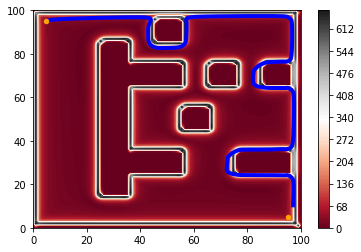

In [16]:
x = np.linspace(0, 100, b.shape[0])
y = np.linspace(0, 100, b.shape[1])

X, Y = np.meshgrid(x, y)

fig, ax = plt.subplots()

plt.contourf(X, Y, F_tot, 200, cmap='RdGy')
plt.colorbar()

plt.scatter(start[1], start[0],color='orange',s=20, zorder=3)
plt.scatter(waypoint[1], waypoint[0],color='orange',s=20, zorder=3)

ax.plot(path[:,0],path[:,1], 'b-', linewidth=4, zorder=2)



plt.show()